## Accessing and Analyzing ADO Datasets with openEO (adapted to our purposes)

## Useful links:
OpenEO Python Client documentation: https://open-eo.github.io/openeo-python-client/index.html

Getting started guide for openEO with python: https://openeo.org/documentation/1.0/python/

## Topics:
- Login to Eurac's openEO backend containing the ADO data sets
- Discover the data sets and processes
- Access and download data
- Process data via openEO processes
- Common use cases:
    - get vhi timeseries interactively at a point and plot the timeseries
    - get vhi over an area and mask out buildings from Corine classification map

## Install the Python environment and the required libraries:
1. Install Anaconda, the following link provides the instructions for Windows, Linux and Mac: https://docs.anaconda.com/anaconda/install/index.html
you can also check if it's already installed typing `conda --version` in a terminal
2. Clone this repository:
```
git clone https://gitlab.inf.unibz.it/ado/openeo4ado.git
cd openeo4ado
cd python
```
3. Create and activate the conda environment:
```
conda env create -f environment.yml
conda activate openeo
```
4. Start the jupyter notebook
```
jupyter notebook
```

### Import all the libraries and utilities functions included in the eo_utils.py file

In [1]:
from eo_utils import *

### Login to EURAC backend via oidc.

In [2]:
euracHost = "https://openeo.eurac.edu"
conn = openeo.connect(euracHost).authenticate_oidc(client_id="openEO_PKCE")

Authenticated using refresh token.


### Get the info of our account:

In [3]:
conn.describe_account()

{'user_id': '5839ab5e-091f-4c24-8c92-6bb890eaf01a',
 'name': 'Veronica Cardigliano',
 'links': None}

### Discover the available collections:

In [7]:
conn.list_collections()

[{'engine': 'WCPS',
  'stac_version': '0.9.0',
  'stac_extensions': ['datacube'],
  'type': 'Collection',
  'id': 'ADO_CORINE_100m_3035',
  'title': 'Corine Land Cover (CLC) 2018',
  'description': 'CLC2018 is one of the Corine Land Cover (CLC) datasets produced within the frame the Copernicus Land Monitoring Service referring to land cover / land use status of year 2018. CLC service has a long-time heritage (formerly known as "CORINE Land Cover Programme"), coordinated by the European Environment Agency (EEA). It provides consistent and thematically detailed information on land cover and land cover changes across Europe.',
  'keywords': ['Copernicus',
   'Land',
   'Satellite Image Interpretation',
   '2018',
   'Corine',
   'Corine Land Cover',
   'ADO project',
   'ADO'],
  'version': 'v1',
  'deprecated': False,
  'license': 'EUR-Lex',
  'sci:citation': 'Copyright holder: European Environment Agency (EEA)',
  'providers': [{'name': 'eurac research',
    'url': 'http://www.eurac.edu',
    'roles': ['Host']},
   {'name': 'European Environment Agency (EEA)',
    'url': 'copernicus@eea.europa.eu',
    'roles': ['Producer']}],
  'extent': {'spatial': {'bbox': [[4.007710199040072,
      42.8856831393187,
      17.506871070250423,
      50.319480285426245]]},
   'temporal': {'interval': [[None, None]]}},
  'links': [{'rel': 'licence',
    'href': 'https://eur-lex.europa.eu/legal-content/EN/TXT/?uri=CELEX:32013R1159',
    'type': 'text/html',
    'title': 'License Link'}],
  'cube:dimensions': {'X': {'type': 'spatial',
    'axis': 'x',
    'extent': [4.007710199040072, 17.506871070250423],
    'reference_system': 3035},
   'Y': {'type': 'spatial',
    'axis': 'y',
    'extent': [42.8856831393187, 50.319480285426245],
    'reference_system': 3035},
   'bands': {'type': 'bands', 'values': ['CLC2018_WM']}},
  'summaries': {'constellation': [None],
   'platform': [None],
   'rows': 8332,
   'columns': 10240,
   'instruments': [None],
   'eo:cloud cover': {'min': 0.0, 'max': 0.0},
   'gsd': [],
   'eo:bands': [{'name': 'CLC2018_WM', 'center_wavelength': 0.0, 'gsd': 0.0}]},
  'assets': {}},
 {'engine': 'WCPS',
  'stac_version': '0.9.0',
  'stac_extensions': ['datacube'],
  'type': 'Collection',
  'id': 'ADO_EU_DEM_25m_3035',
  'title': 'Copernicus Land Monitoring Service - EU-DEM',
  'description': 'EU-DEM is a digital surface model (DSM) of EEA member and cooperating countries representing the first surface as illuminated by the sensors. It is a hybrid product based on SRTM and ASTER GDEM data fused by a weighted averaging approach.',
  'keywords': ['elevation', 'terrain', 'ADO project', 'ADO'],
  'version': 'v1',
  'deprecated': False,
  'license': 'CC-BY-4.0',
  'sci:citation': 'Copyright holder: European Environment Agency (EEA)',
  'providers': [{'name': 'Eurac EO WCS',
    'url': 'http://www.eurac.edu',
    'roles': ['Host']},
   {'name': 'European Environment Agency (EEA)',
    'url': 'copernicus@eea.europa.eu',
    'roles': ['Producer']}],
  'extent': {'spatial': {'bbox': [[4.00836448784761,
      42.88526925644299,
      17.50816233265968,
      50.318718106310065]]},
   'temporal': {'interval': [[None, None]]}},
  'links': [{'rel': 'licence',
    'href': 'https://creativecommons.org/licenses/by/4.0/',
    'type': 'text/html',
    'title': 'License Link'}],
  'cube:dimensions': {'X': {'type': 'spatial',
    'axis': 'x',
    'extent': [4.00836448784761, 17.50816233265968],
    'reference_system': 3035},
   'Y': {'type': 'spatial',
    'axis': 'y',
    'extent': [42.88526925644299, 50.318718106310065],
    'reference_system': 3035},
   'bands': {'type': 'bands', 'values': ['EUElev_DEM_V11']}},
  'summaries': {'constellation': ['SRTM / ASTER GDEM'],
   'platform': ['SRTM / ASTER GDEM'],
   'rows': 33327,
   'columns': 40962,
   'instruments': [None],
   'eo:cloud cover': {'min': 0.0, 'max': 0.0},
   'gsd': [],
   'eo:bands': [{'name': 'EUElev_DEM_V11',
     'center_wavelength': 0.0,
     'gsd': 0.0}]},
  'assets': {}},
 {'engine':

### Discover the available processes:

In [49]:
conn.list_processes()

[{'engine': '[ODC_DASK]',
  'id': 'dimension_labels',
  'summary': 'Get the dimension labels',
  'description': 'Returns all labels for a dimension in the data cube. The labels have the same order as in the data cube.',
  'parameters': [{'schema': {'subtype': 'raster-cube', 'type': 'object'},
    'name': 'data',
    'description': 'The data cube.'},
   {'schema': {'type': 'string'},
    'name': 'dimension',
    'description': 'The name of the dimension to get the labels for.'}],
  'categories': ['cubes'],
  'returns': {'schema': {'type': 'array',
    'items': {'anyOf': [{'type': 'number'}, {'type': 'string'}]}},
   'description': 'The labels as array.'},
  'exceptions': {}},
 {'engine': '[WCPS, ODC_DASK]',
  'id': 'ln',
  'summary': 'Natural logarithm',
  'description': 'The natural logarithm is the logarithm to the base *e* of the number `x`, which equals to using the *log* process with the base set to *e*. The natural logarithm is the inverse function of taking *e* to the power x.\n\nThe no-data value `null` is passed through.\n\nThe computations follow [IEEE Standard 754](https://ieeexplore.ieee.org/document/8766229) whenever the processing environment supports it. Therefore, `ln(0)` results in ±infinity if the processing environment supports it or otherwise an error is thrown.',
  'parameters': [{'schema': {'type': ['number', 'null']},
    'name': 'x',
    'description': 'A number to compute the natural logarithm for.'}],
  'categories': ['math > exponential & logarithmic'],
  'links': [{'rel': 'about',
    'href': 'http://mathworld.wolfram.com/NaturalLogarithm.html',
    'title': 'Natural logarithm explained by Wolfram MathWorld'},
   {'rel': 'about',
    'href': 'https://ieeexplore.ieee.org/document/8766229',
    'title': 'IEEE Standard 754-2019 for Floating-Point Arithmetic'}],
  'returns': {'schema': {'type': ['number', 'null']},
   'description': 'The computed natural logarithm.'},
  'exceptions': {},
  'examples': [{'arguments': {'x': 1}, 'returns': 0}]},
 {'engine': '[ODC_DASK]',
  'id': 'coherence',
  'summary': 'Compute the complex coherence with SAR data',
  'description': 'Compute the complex coherence with SAR data, given the specified time delta.',
  'parameters': [{'schema': {'subtype': 'raster-cube', 'type': 'object'},
    'name': 'data',
    'description': 'A raster data cube with exactly two horizontal spatial dimensions and an arbitrary number of additional dimensions. The process is applied to all additional dimensions individually.'},
   {'schema': {'type': 'integer',
     'enum': [6, 12, 18, 24, 30, 36, 42, 48, 54, 60, 66, 72, 78, 84, 90, 96]},
    'default': '6',
    'name': 'timedelta',
    'description': 'Temporal delta in days between acquisitions on which we want to compute coherence.',
    'optional': True}],
  'categories': ['cubes', 'math'],
  'returns': {'schema': {'subtype': 'raster-cube', 'type': 'object'},
   'description': 'A data cube with the projected values in the requested projection.'},
  'exceptions': {}},
 {'engine': '[WCPS]',
  'id': 'cos',
  'summary': 'Cosine',
  'description': 'Computes the cosine of `x`.\n\nWorks on radians only.\nThe no-data value `null` is passed through and therefore gets propagated.',
  'parameters': [{'schema': {'type': ['number', 'null']},
    'name': 'x',
    'description': 'An angle in radians.'}],
  'categories': ['math > trigonometric'],
  'links': [{'rel': 'about',
    'href': 'http://mathworld.wolfram.com/Cosine.html',
    'title': 'Cosine explained by Wolfram MathWorld'}],
  'returns': {'schema': {'type': ['number', 'null']},
   'description': 'The computed cosine of `x`.'},
  'exceptions': {},
  'examples': [{'arguments': {'x': 0}, 'returns': 1}]},
 {'engine': '[WCPS, ODC_DASK]',
  'id': 'lt',
  'summary': 'Less than comparison',
  'description': 'Compares whether `x` is strictly less than `y`.\n\n**Remarks:**\n\n* If any operand is `null`, the return value is `null`.\n* If any operand is an array or object, the return value is `false`.\n* If any

## UC1: Get a point (average over small area) time series upon click and visualize it

In [36]:
center = [45.3, 11.35]
zoom = 7

eoMap = openeoMap(center,zoom)
eoMap.map

Map(center=[45.3, 11.35], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_ou…

In [7]:
bbox = eoMap.getBbox()
print("Coordinates selected from map:",'\n west',bbox[0],'\n east',bbox[2],'\n south',bbox[1],'\n north',bbox[3])

Coordinates selected from map: 
 west 6.031494140625001 
 east 16.666259765625004 
 south 43.731414013769 
 north 46.822616668804926


### Load the data with openEO from the selected area for each year 2001 - 2022:

In [4]:
collection      = 'ADO_VHI_MODIS_231m_3035'
# to take the spatial extent defined in the map above:
# spatial_extent  = {'west':bbox[0],'east':bbox[2],'south':bbox[1],'north':bbox[3]}
# spatial_extent used in droughts thesis
spatial_extent  = {'west':6,'east':13.3,'south':43.5,'north':46.8} 
# total temporal_extent: "2001-01-01T00:00:00Z", "2019-01-01T00:00:00Z"
temporal_extent = ["2020-01-01T00:00:00.000Z", "2022-08-29T00:00:00.000Z"]

In [ ]:
for i in range (1, 22):
    if (i < 10):
        temporal_extent = ["200" + str(i) + "-01-01T00:00:00.000Z", "200" + str(i) + "-12-31T00:00:00.000Z"]
        out_name = "vhi_200" + str(i) + ".nc"
    else:
        temporal_extent = ["20" + str(i) + "-01-01T00:00:00.000Z", "20" + str(i) + "-12-31T00:00:00.000Z"]  
        out_name = "vhi_20" + str(i) + ".nc"
    # This results in a Datacube object containing the collection data restricted to the given spatial and temporal extents
    ado_vhi_data = conn.load_collection(collection,spatial_extent=spatial_extent,temporal_extent=temporal_extent)
    result = ado_vhi_data.save_result(format="NetCDF")
    ado_vhi_data.download(out_name, format="netCDF")
    
temporal_extent = ["2022-01-01T00:00:00.000Z", "2022-08-29T00:00:00.000Z"]  
ado_vhi_data = conn.load_collection(collection,spatial_extent=spatial_extent,temporal_extent=temporal_extent)
result = ado_vhi_data.save_result(format="NetCDF")
ado_vhi_data.download("vhi_2022.nc",format="netCDF")

### Download the data as netCDF

In [47]:
ado_vhi_data = conn.load_collection(collection,spatial_extent=spatial_extent,temporal_extent=temporal_extent)
result = ado_vhi_data.save_result(format="NetCDF")

In [16]:
ado_vhi_data.download("vhi_2003.nc",format="netCDF")

In [48]:
# https://open-eo.github.io/openeo-python-client/batch_jobs.html#download-batch-job-results
# start a batch job for larger requests
job = result.create_job(title = "VHI_timeseries_2020_2022")

#job.get_results().download_files("output")

In [49]:
job.start_and_wait()

0:00:00 Job 'f4572d00-a105-410e-b5c5-11adc567c39c': send 'start'
0:00:00 Job 'f4572d00-a105-410e-b5c5-11adc567c39c': queued (progress 0.0%)
0:00:05 Job 'f4572d00-a105-410e-b5c5-11adc567c39c': running (progress 0.0%)
0:00:11 Job 'f4572d00-a105-410e-b5c5-11adc567c39c': running (progress 0.0%)
0:00:19 Job 'f4572d00-a105-410e-b5c5-11adc567c39c': running (progress 0.0%)
0:00:29 Job 'f4572d00-a105-410e-b5c5-11adc567c39c': finished (progress 100.0%)


<BatchJob job_id='f4572d00-a105-410e-b5c5-11adc567c39c'>

In [ ]:
job.status()

The data needs to be rescaled back to the 0 - 1 range. We just need to divide it with 10000.

In [5]:
vhi_timeseries = xr.open_dataset('/Volumes/Vero/thesis_data/openeo4ado/python/complete_nc/3_shots/vhi_2001_2009.nc') / 100
vhi_timeseries

<xarray.Dataset>
Dimensions:  (DATE: 411, X: 2487, Y: 1567)
Coordinates:
  * DATE     (DATE) float64 9.787e+08 9.793e+08 9.8e+08 ... 1.261e+09 1.262e+09
  * X        (X) float64 3.997e+06 3.997e+06 3.997e+06 ... 4.573e+06 4.573e+06
  * Y        (Y) float64 2.637e+06 2.637e+06 2.637e+06 ... 2.275e+06 2.275e+06
Data variables:
    8d_vhi   (DATE, Y, X) float32 nan nan nan nan nan ... 0.14 0.03 0.19 0.13
Attributes: (12/25)
    Citation:           Kogan, F. N. (eds) (1995): Application of vegetation ...
    Columns:            4430
    Constellation:      Terra
    Creator:            Eurac Research
    Description:        The Vegetation Health Index (VHI) is based on a combi...
    Instruments:        MODIS
    ...                 ...
    Provider3_Name:     NASA
    Provider3_Roles:    Producer
    Rows:               3606
    Temporal_Step:      P8D
    Title:              Vegetation Health Index - 231 m 8 days
    Version:            1.0

We convert the dates from UNIX epoch time into a readable format and plot the data in an interactive view:

In [6]:
import time
dates = vhi_timeseries.DATE.values
vhi_timeseries['DATE'] = [time.strftime('%Y-%m-%d', time.localtime(epoch_time)) for epoch_time in dates]
# vhi_timeseries.hvplot.scatter(x='DATE',rot=45,width=1000,grid=True) too heavy for all North Italy zone

In [7]:
vhi_timeseries

<xarray.Dataset>
Dimensions:  (DATE: 411, X: 2487, Y: 1567)
Coordinates:
  * DATE     (DATE) <U10 '2001-01-05' '2001-01-13' ... '2009-12-21' '2009-12-29'
  * X        (X) float64 3.997e+06 3.997e+06 3.997e+06 ... 4.573e+06 4.573e+06
  * Y        (Y) float64 2.637e+06 2.637e+06 2.637e+06 ... 2.275e+06 2.275e+06
Data variables:
    8d_vhi   (DATE, Y, X) float32 nan nan nan nan nan ... 0.14 0.03 0.19 0.13
Attributes: (12/25)
    Citation:           Kogan, F. N. (eds) (1995): Application of vegetation ...
    Columns:            4430
    Constellation:      Terra
    Creator:            Eurac Research
    Description:        The Vegetation Health Index (VHI) is based on a combi...
    Instruments:        MODIS
    ...                 ...
    Provider3_Name:     NASA
    Provider3_Roles:    Producer
    Rows:               3606
    Temporal_Step:      P8D
    Title:              Vegetation Health Index - 231 m 8 days
    Version:            1.0

Simpler way of plotting the average VHI over the requested area:

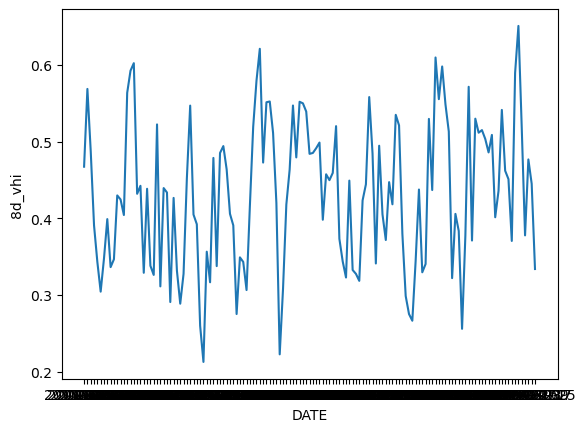

In [36]:
vhi_timeseries['8d_vhi'].mean(dim=['X','Y']).plot()

## UC2: Corine Classification data and VHI values

Please select the area covering Bolzano and the sorroundings using the rectangle selection tool:

We load the Corine data and mask out all the artificial areas (classified with numbers between 100:199)

In [9]:
collection = 'ADO_CORINE_100m_3035_ODC'
# spatial_extent  = {'west':bbox[0],'east':bbox[2],'south':bbox[1],'north':bbox[3]}

# using the same spatial extent as before

corine_data = conn.load_collection(collection,spatial_extent=spatial_extent).reduce_dimension(dimension='DATE',reducer='mean')

land_cover_band = corine_data.band('CLC2018_WM')
mask = ~(land_cover_band >= 200)
corine_data_nobuildings = corine_data.mask(mask)

We download the masked Corine raster:

In [10]:
corine_data_nobuildings.download("corine_data_nobuildings.tif",format="GTIFF")

We can now get a quick view of the downloaded data, with masked areas in balck.

In [5]:
import rioxarray

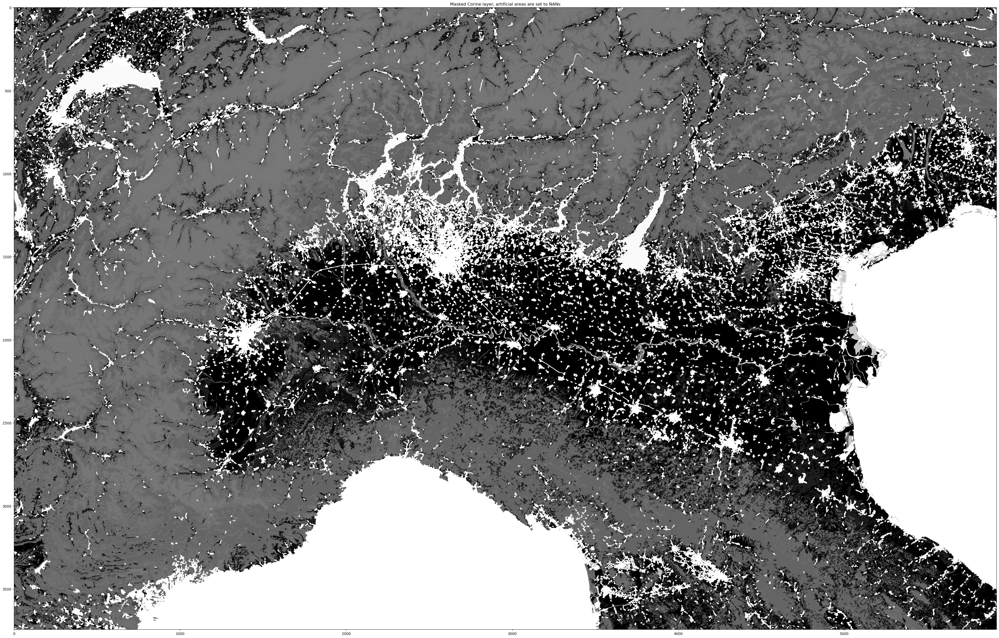

In [6]:
corine_image = rioxarray.open_rasterio("corine_data_nobuildings.tif")
fig, ax1 = plt.subplots(1,1,figsize=(50,80))
ax1.set_title('Masked Corine layer, artificial areas are set to NANs')
ax1.imshow(corine_image[0],cmap='Greys_r')

Now we load the VHI data for the same area. This has a different resolution (approx. 231 m) compared to the Corine layer (100m)

In [23]:
collection = 'ADO_VHI_MODIS_231m_3035'
# in this case considered just one week sample
temporal_extent_oneweek = ["2019-07-01T00:00:00.000Z", "2019-07-07T00:00:00.000Z"]

vhi_data_oneweek = conn.load_collection(collection,spatial_extent=spatial_extent,temporal_extent=temporal_extent_oneweek)
vhi_data_oneweek.download("vhi_one_week.nc",format="netCDF")

In [23]:
vhi_datacube = xr.open_mfdataset("complete_nc/3_shots/vhi_2001_2009.nc", chunks={'time': 1}) / 100
vhi_datacube = vhi_datacube.rename({'X':'x','Y':'y'})
#print(vhi_datacube)

In [24]:
vhi_datacube

<xarray.Dataset>
Dimensions:  (DATE: 411, x: 2487, y: 1567)
Coordinates:
  * DATE     (DATE) float64 9.787e+08 9.793e+08 9.8e+08 ... 1.261e+09 1.262e+09
  * x        (x) float64 3.997e+06 3.997e+06 3.997e+06 ... 4.573e+06 4.573e+06
  * y        (y) float64 2.637e+06 2.637e+06 2.637e+06 ... 2.275e+06 2.275e+06
Data variables:
    8d_vhi   (DATE, y, x) float32 dask.array<chunksize=(411, 1567, 2487), meta=np.ndarray>
Attributes: (12/25)
    Citation:           Kogan, F. N. (eds) (1995): Application of vegetation ...
    Columns:            4430
    Constellation:      Terra
    Creator:            Eurac Research
    Description:        The Vegetation Health Index (VHI) is based on a combi...
    Instruments:        MODIS
    ...                 ...
    Provider3_Name:     NASA
    Provider3_Roles:    Producer
    Rows:               3606
    Temporal_Step:      P8D
    Title:              Vegetation Health Index - 231 m 8 days
    Version:            1.0

In [16]:
corine_image = corine_image.rio.set_crs('epsg:3035')
vhi_datacube = vhi_datacube['8d_vhi'].rio.set_crs('epsg:3035')

To mask the VHI data, we reproject the Corine mask to match the resolution of the VHI layer.

In [17]:
corine_image_reproj = corine_image.rio.reproject_match(vhi_datacube)
corine_image_reproj = corine_image_reproj.assign_coords({
    "x": vhi_datacube.x,
    "y": vhi_datacube.y,
})
corine_mask = corine_image_reproj > 0
corine_mask

<xarray.DataArray (band: 1, y: 1567, x: 2487)>
array([[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]]])
Coordinates:
  * x            (x) float64 3.997e+06 3.997e+06 ... 4.573e+06 4.573e+06
  * y            (y) float64 2.637e+06 2.637e+06 ... 2.275e+06 2.275e+06
  * band         (band) int64 1
    spatial_ref  int64 0

With the two layers in the same grid and resolution, we can apply the mask and visualize the result:

In [18]:
masked_vhi = vhi_datacube.fillna(0) * corine_mask[0]

# date = time.strftime('%Y-%m-%d', time.localtime(masked_vhi.DATE))

#fig, ax1 = plt.subplots(1,1,figsize=(50,50))

#ax1.imshow(masked_vhi[0],cmap='Greens')
#ax1.set_title('VHI values for ' + '2019-07-05' + ' without artificial areas')
#sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=0, vmax=1))
#plt.colorbar(sm,orientation="horizontal")

In [19]:
masked_vhi

<xarray.DataArray (DATE: 121, y: 1567, x: 2487)>
dask.array<mul, shape=(121, 1567, 2487), dtype=float32, chunksize=(121, 1567, 2487), chunktype=numpy.ndarray>
Coordinates:
  * DATE         (DATE) float64 1.578e+09 1.579e+09 ... 1.66e+09 1.661e+09
  * x            (x) float64 3.997e+06 3.997e+06 ... 4.573e+06 4.573e+06
  * y            (y) float64 2.637e+06 2.637e+06 ... 2.275e+06 2.275e+06
    band         int64 1
    spatial_ref  int64 0

Write the result as a GeoTiff and visualize it over a map:

In [20]:
masked_vhi.rio.to_raster('masked_vhi_2020_2022.tif')